In [1]:
# !git clone https://github.com/JJGO/UniverSeg
# !python -m pip install -r ./UniverSeg/requirements.txt

In [143]:
# !git clone https://github.com/zxaoyou/segmentation_WBC.git

In [139]:
# import os
# import shutil

# def separate_images(source_folder, bmp_folder, png_folder):
#     # Create folders if they don't exist
#     if not os.path.exists(bmp_folder):
#         os.makedirs(bmp_folder)
#     if not os.path.exists(png_folder):
#         os.makedirs(png_folder)

#     # Iterate through files in the source folder
#     for filename in os.listdir(source_folder):
#         if filename.endswith(".bmp"):
#             shutil.copy(os.path.join(source_folder, filename), os.path.join(bmp_folder, filename))
#         elif filename.endswith(".png"):
#             shutil.copy(os.path.join(source_folder, filename), os.path.join(png_folder, filename))

# # Define source folder and destination folders for .bmp and .png files
# source_folder = "/storage/scratch1/e18-4yp-medical-img-anno/UniverSeg/segmentation_WBC/Dataset 1"
# bmp_folder = "/storage/scratch1/e18-4yp-medical-img-anno/wbc_images"
# png_folder = "/storage/scratch1/e18-4yp-medical-img-anno/wbc_masks"

# # Call the function to separate images
# separate_images(source_folder, bmp_folder, png_folder)


In [1]:
import math
import itertools

from tqdm.auto import tqdm
import numpy as np
import matplotlib.pyplot as plt

import einops as E

/home/e18245/anaconda3/envs/test/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
%cd UniverSeg

/storage/scratch1/e18-4yp-medical-img-anno/UniverSeg


In [3]:
!nvidia-smi

Thu May 30 19:22:40 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.06              Driver Version: 545.23.06    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A6000               On  | 00000000:15:00.0 Off |                  Off |
| 36%   61C    P8              17W / 300W |     12MiB / 49140MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [4]:
import torch
torch.cuda.is_available()

True

In [5]:
# import sys
# sys.path.append('UniverSeg')
device = 'cuda:1' if torch.cuda.is_available() else 'cpu'

from universeg import universeg
model = universeg(pretrained=True)
_ = model.to(device)

In [6]:
device

'cuda:1'

In [7]:
import os
import random
import shutil
import cv2
import PIL
# from google.colab.patches import cv2_imshow

In [8]:
def visualize_tensors(tensors, col_wrap=8, col_names=None, title=None):
    M = len(tensors)
    N = len(next(iter(tensors.values())))

    cols = col_wrap
    rows = math.ceil(N/cols) * M

    d = 2.5
    fig, axes = plt.subplots(rows, cols, figsize=(d*cols, d*rows))
    if rows == 1:
      axes = axes.reshape(1, cols)

    for g, (grp, tensors) in enumerate(tensors.items()):
        for k, tensor in enumerate(tensors):
            col = k % cols
            row = g + M*(k//cols)
            x = tensor.detach().cpu().numpy().squeeze()
            ax = axes[row,col]
            if len(x.shape) == 2:
                ax.imshow(x, vmin=0, vmax=1,cmap='gray')
            else:
                ax.imshow(E.rearrange(x,'C H W -> H W C'))
            if col == 0:
                ax.set_ylabel(grp, fontsize=16)
            if col_names is not None and row == 0:
                ax.set_title(col_names[col])

    for i in range(rows):
        for j in range(cols):
            ax = axes[i,j]
            ax.grid(False)
            ax.set_xticks([])
            ax.set_yticks([])

    if title:
        plt.suptitle(title, fontsize=20)

    plt.tight_layout()

In [9]:
# images_folder = "/storage/scratch1/e18-4yp-medical-img-anno/FS_Segmentation/FSMS-Surrogate/ISIC2018/ISIC2018_Task1-2_Training_Input"
# images_folder="/storage/scratch1/e18-4yp-medical-img-anno/wbc_images"
# images_folder="/storage/scratch1/e18-4yp-medical-img-anno/tufts/tufts/images"
# masks_folder = "/storage/scratch1/e18-4yp-medical-img-anno/tufts/tufts/labels"
# images_folder="/storage/scratch1/e18-4yp-medical-img-anno/dataset/opmd"

# for mask in os.listdir(masks_folder):
#     path=os.path.join(masks_folder,mask)
#     mask_img=PIL.Image.open(path)
#     mask_img.save('/storage/scratch1/e18-4yp-medical-img-anno/tufts/tufts/png_masks/'+mask.split(".")[0]+'.png')

In [11]:
# labels_folder="/storage/scratch1/e18-4yp-medical-img-anno/isic_masks"
# labels_folder="/storage/scratch1/e18-4yp-medical-img-anno/wbc_masks"
# labels_folder="/storage/scratch1/e18-4yp-medical-img-anno/tufts/tufts/png_masks"
# labels_folder="/storage/scratch1/e18-4yp-medical-img-anno/dataset/oc_masks/opmd"

In [12]:
# image_filenames = sorted(os.listdir(images_folder))
# image_filenames=[filename.lower() if filename.lower().endswith('.jpg') else filename for filename in image_filenames]
# mask_filenames = sorted(os.listdir(labels_folder))
# image_filenames = sorted(file for file in os.listdir(images_folder) if file.endswith('.jpg'))
# mask_filenames = sorted(file for file in  os.listdir(labels_folder) if file.endswith('.jpg'))

In [10]:
# (len(image_filenames),len(mask_filenames))

In [ ]:
# filtered_image_filenames=[]
# filtered_mask_filenames=[]

# for file in image_filenames:
#     if file in mask_filenames:
#         filtered_image_filenames.append(file)
#         filtered_mask_filenames.append(file)
#     else:
#         continue

In [ ]:
# (len(filtered_image_filenames),len(filtered_mask_filenames))

In [14]:
# combined_filenames = list(zip(image_filenames, mask_filenames))
# random.shuffle(combined_filenames)
# split_index = int(0.7 * len(combined_filenames))

# support_filenames = combined_filenames[:split_index]
# test_filenames = combined_filenames[split_index:]

In [11]:
# (len(support_filenames),len(test_filenames))

In [12]:
# support_images, support_labels = zip(*[(os.path.join(images_folder, image_filename), os.path.join(labels_folder, mask_filename)) for image_filename, mask_filename in support_filenames])

In [9]:
support_images_folder='/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/support/images'
support_labels_folder='/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/support/labels'
test_images_folder='/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images'
test_labels_folder='/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/labels'

In [10]:
support_images=[]
support_labels=[]
test_images=[]
test_labels=[]
def create_arrays(arr,folder_path):
    for file in sorted(os.listdir(folder_path)):
        arr.append(os.path.join(folder_path,file))


In [11]:
create_arrays(support_images,support_images_folder)
create_arrays(support_labels,support_labels_folder)
create_arrays(test_images,test_images_folder)
create_arrays(test_labels,test_labels_folder)

In [12]:
n_support=100
_support_images=support_images[:n_support]
_support_labels=support_labels[:n_support]

In [13]:
def process_img(path: None):
    img = PIL.Image.open(path)
    img = img.resize((128,128), resample=PIL.Image.BILINEAR)
    img = img.convert("L")
    img = np.array(img)
    img = img.astype(np.float32)
    return img / 255.0

def process_seg(path: None):
    seg = PIL.Image.open(path)
    seg = seg.resize((128,128), resample=PIL.Image.NEAREST)
    if (seg.mode=='RGB'):
        seg=seg.convert("L")
    seg = np.array(seg)
    seg = np.stack([seg == 0, seg == 128, seg == 255])
    seg = seg.astype(np.float32)
    return seg



In [36]:
# list(np.array(PIL.Image.open(_support_labels[0])))

In [14]:
T = torch.from_numpy

In [15]:
T(process_img(_support_images[0]))[None].shape

torch.Size([1, 128, 128])

In [16]:
process_img(_support_images[0])

array([[0.99215686, 0.99607843, 0.99215686, ..., 1.        , 1.        ,
        0.99607843],
       [0.99215686, 0.96862745, 0.95686275, ..., 0.99215686, 1.        ,
        1.        ],
       [0.94509804, 0.88235295, 0.8784314 , ..., 0.9607843 , 0.99215686,
        1.        ],
       ...,
       [0.69411767, 0.4745098 , 0.42352942, ..., 0.47058824, 0.6784314 ,
        0.9529412 ],
       [0.627451  , 0.4       , 0.36078432, ..., 0.4509804 , 0.70980394,
        0.972549  ],
       [0.7294118 , 0.5764706 , 0.53333336, ..., 0.654902  , 0.83137256,
        0.98039216]], dtype=float32)

In [40]:
process_seg(_support_labels[0]).shape

(3, 128, 128)

In [41]:
T(process_seg(_support_labels[0]))[2][None].shape

torch.Size([1, 128, 128])

In [42]:
processed_support_images = [T(process_img(image))[None] for image in _support_images]
processed_support_labels = [T(process_seg(label))[2][None] for label in _support_labels]

support_images = torch.stack(processed_support_images).to(device)
support_labels = torch.stack(processed_support_labels).to(device)

In [43]:
support_images.shape

torch.Size([100, 1, 128, 128])

In [44]:
support_labels.shape

torch.Size([100, 1, 128, 128])

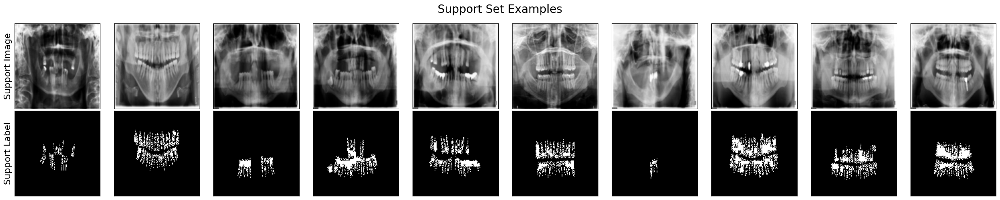

In [45]:
n_viz = 10
visualize_tensors({
    'Support Image': support_images[:n_viz],
    'Support Label': support_labels[:n_viz],
}, col_wrap=10, title='Support Set Examples')

In [28]:
# # select an image, label test pair
# idx = np.random.permutation(len(test_filenames))[0]
# image, label = test_filenames[idx]
# image,label=os.path.join(images_folder, image), os.path.join(labels_folder, label)
# # print(image,label)

# image = T(process_img(image))[None].to(device)
# label= T(process_seg(label))[2][None].to(device)


In [29]:
# label.shape

In [30]:
# # run inference
# logits = model(image[None], support_images[None], support_labels[None])[0].to('cpu')
# pred = torch.sigmoid(logits)

In [31]:
# logits

In [32]:
# pred

In [33]:
# # visualize
# res = {'data': [image, label, pred, pred > 0.4]}
# titles = col_names=['image', 'label', 'pred (soft)', 'pred (hard)']
# visualize_tensors(res, col_wrap=4, col_names=titles)

In [46]:
# Dice metric for measuring volume agreement
def dice_score(y_pred: torch.Tensor, y_true: torch.Tensor) -> float:
    y_pred = y_pred.long()
    y_true = y_true.long()
    score = 2*(y_pred*y_true).sum() / (y_pred.sum() + y_true.sum())
    return score.item()

In [47]:
# run inference and compute losses for one test image
@torch.no_grad()
def inference(model, image, label, support_images, support_labels):
    image, label = image.to(device), label.to(device)

    # inference
    logits = model(
        image[None],
        support_images[None],
        support_labels[None]
    )[0] # outputs are logits

    soft_pred = torch.sigmoid(logits)
    hard_pred = soft_pred.round().clip(0,1)

    #  score
    score = dice_score(hard_pred, label)

    # return a dictionary of all relevant variables
    return {'Image': image,
            'Soft Prediction': soft_pred,
            'Prediction': hard_pred,
            'Ground Truth': label,
            'score': score}

In [48]:
# from collections import defaultdict

# n_predictions = 10

# results = defaultdict(list)

# # compute inference and save predictions and metrics for n_predictions
# idxs = test_images[:n_predictions]

# for image in tqdm(idxs):
#     label=test_labels[test_images.index(image)]
#     # image, label = test_filenames[i]
#     # image,label=os.path.join(images_folder, image), os.path.join(labels_folder, label)
#     image = T(process_img(image))[None]
#     label= T(process_seg(label))[None]
#     vals = inference(model, image, label, support_images, support_labels)
#     for k, v in vals.items():
#         results[k].append(v)

# # visualize the results, along with their scores
# scores = results.pop('score')
# visualize_tensors(results,
#                   col_names=[f'Dice = {100*s:.1f}' for s in scores],
#                   title='Test Predictions',
#                   col_wrap=n_predictions)

In [37]:
# test_images

/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/1.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/1.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/1.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/1.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/1.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/1.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/1.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/1004.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/1004.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/1004.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/1004.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/1004.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evalua

/tmp/ipykernel_163074/1291828162.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(rows, cols, figsize=(d*cols, d*rows))


/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/117.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/117.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/117.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/117.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/117.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/117.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/117.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/12.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/12.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/12.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/12.JPG
/storage/scratch1/e18-4yp-medical-img-anno/evaluation/tufts/test/images/12.JPG
/storage/scratch1/e18-4yp-medical-img-anno/ev

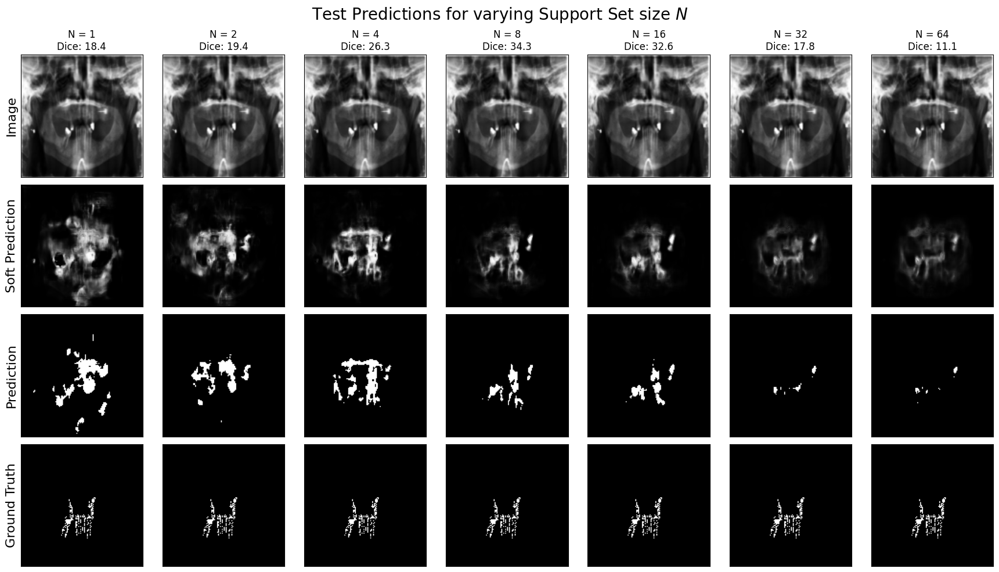

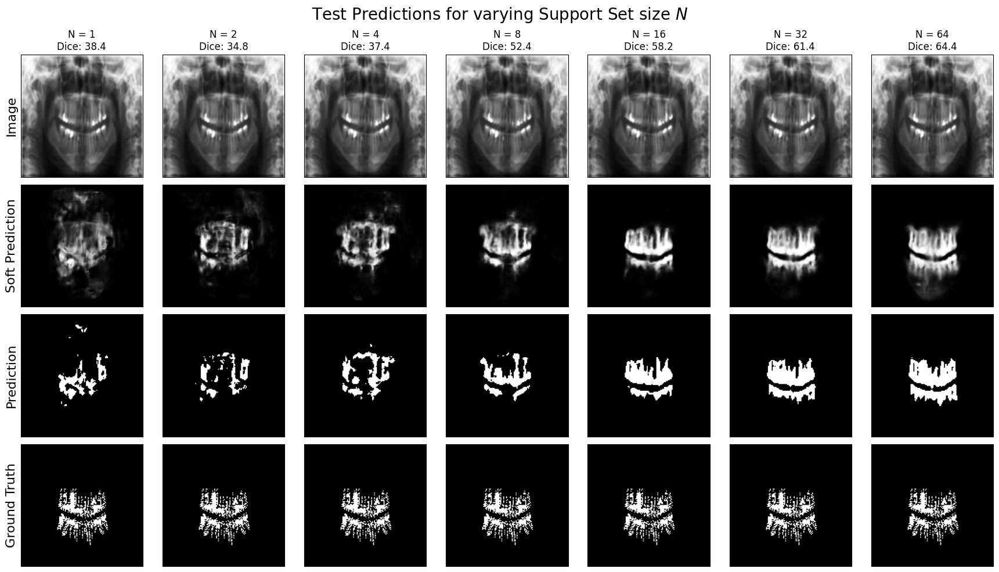

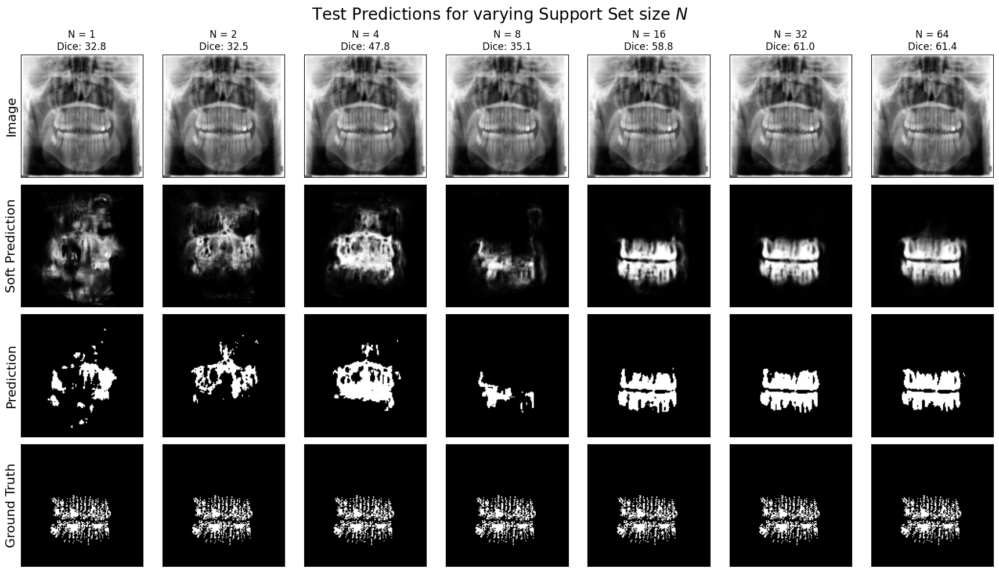

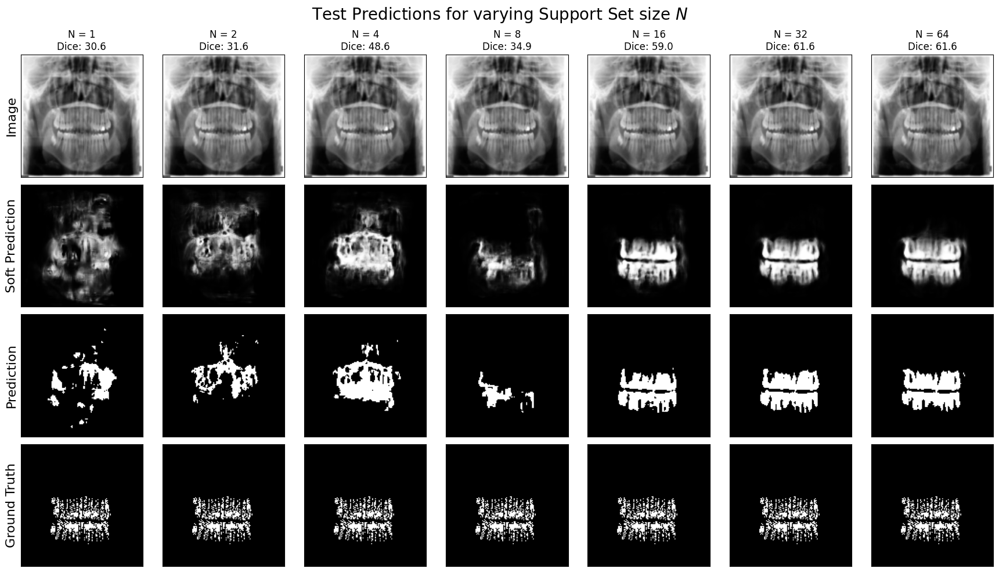

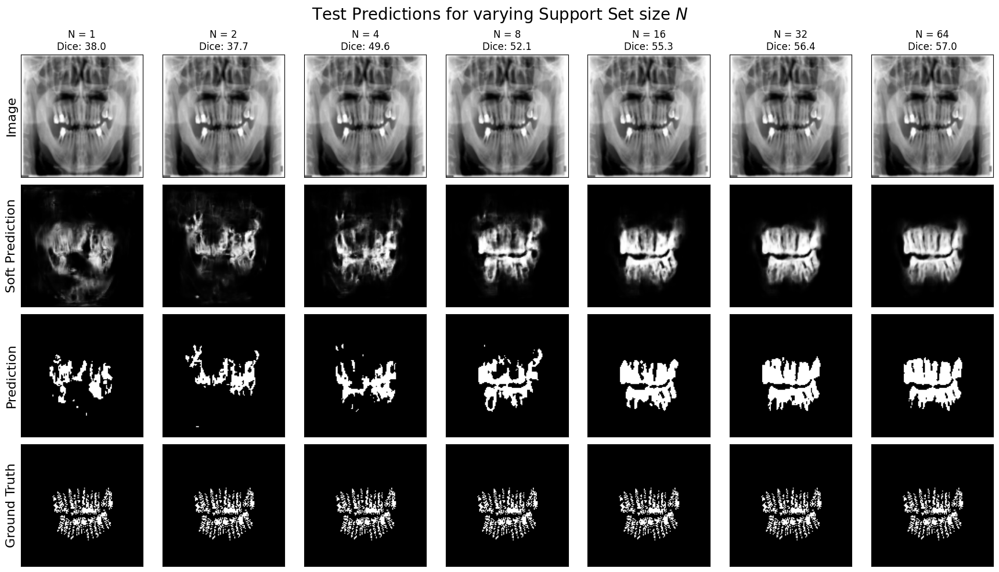

...

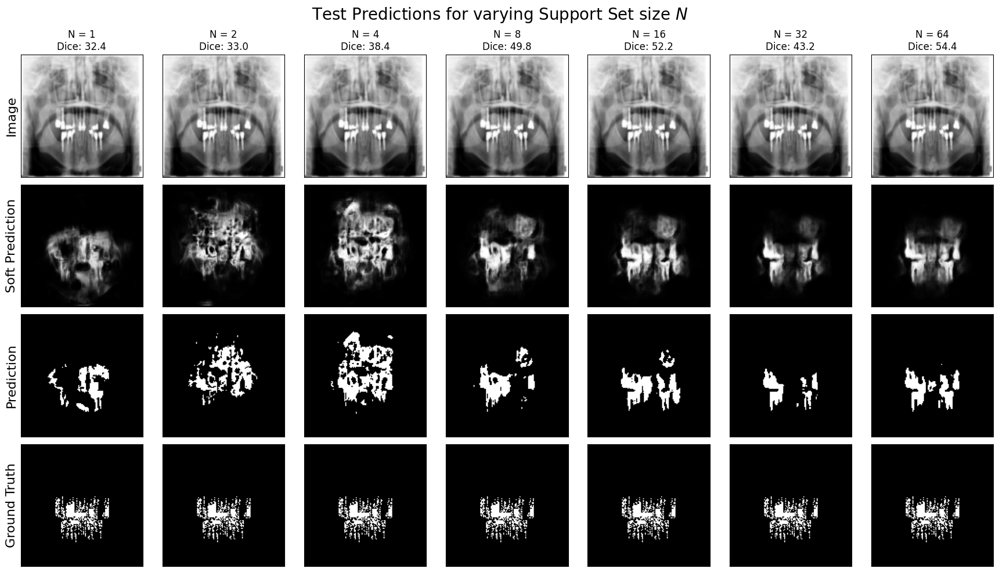

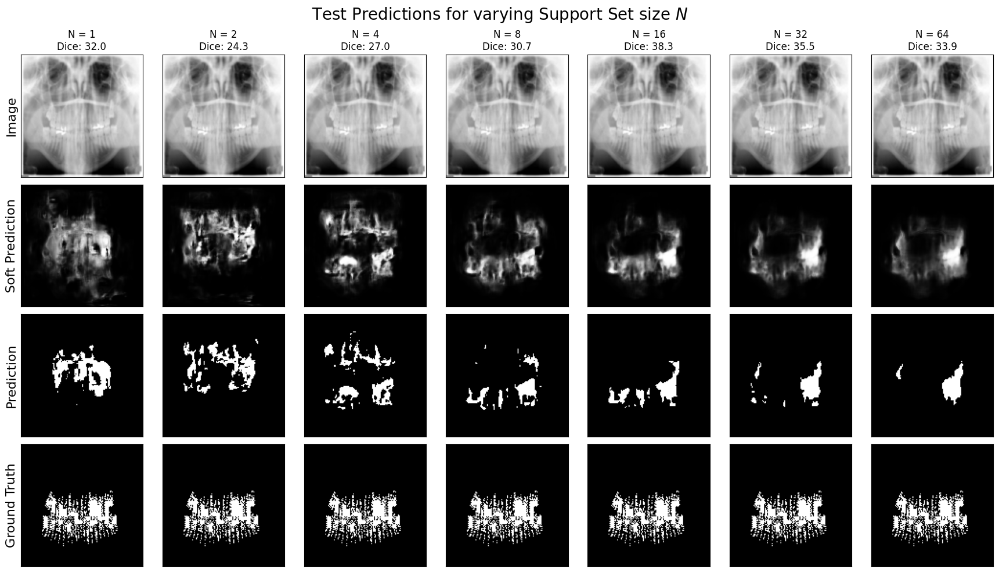

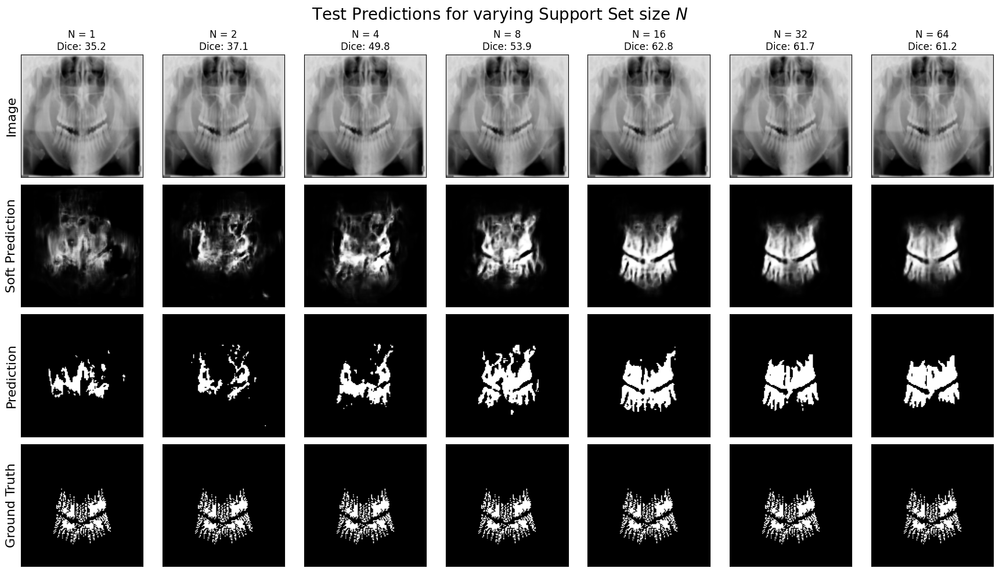

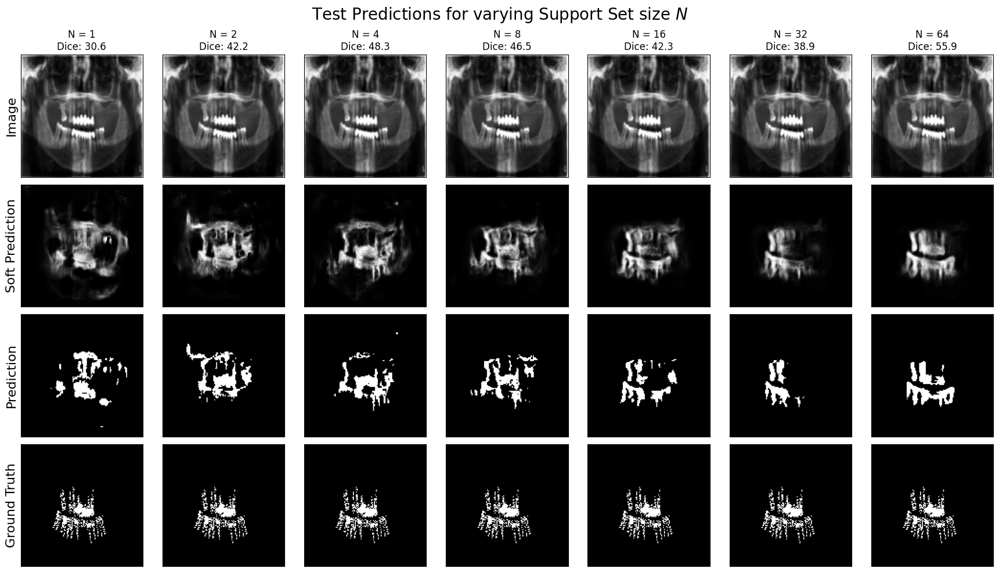

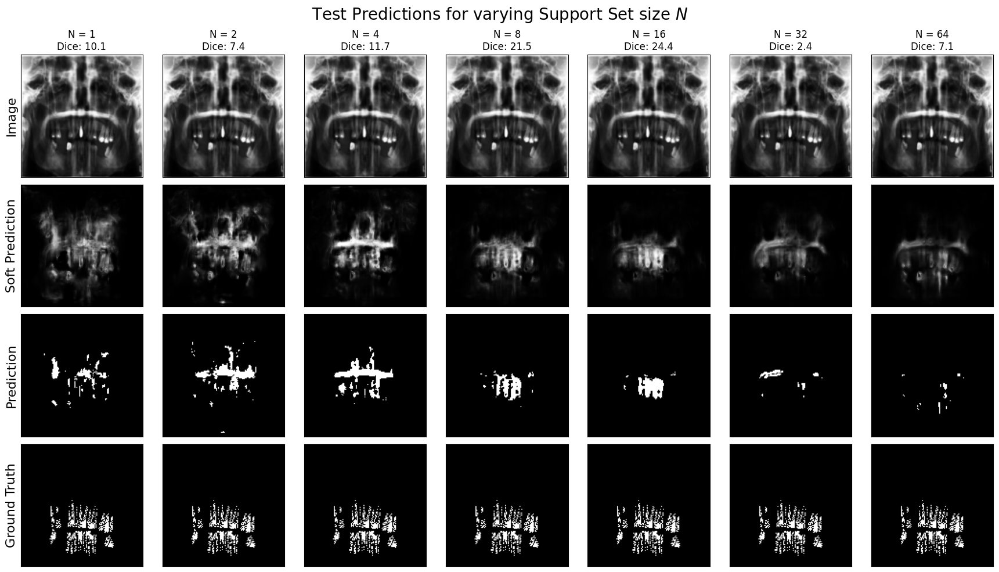

In [49]:
from collections import defaultdict
n_predictions = 30
support_set_sizes = [1, 2, 4, 8, 16, 32, 64]

# idxs = np.random.permutation(len(d_test))[:n_predictions]
# idx = np.random.permutation(len(test_filenames))[:n_predictions]
# image, label = test_filenames[idx]

support_set_scores=[]
for i in range(30):
    results = defaultdict(list)
    for N in support_set_sizes:
        image = test_images[i]
        label=test_labels[test_images.index(image)]
        print(image)
        # image,label=os.path.join(images_folder, image), os.path.join(labels_folder, label)
        image = T(process_img(image))[None]
        label= T(process_seg(label))[2][None]
        vals = inference(model, image, label, support_images[:N], support_labels[:N])
        for k, v in vals.items():
            results[k].append(v)

    # visualize for this entry for different support sizes
    scores = results.pop('score')
    support_set_scores.append(scores)
    col_names = [f'N = {N}' for N in support_set_sizes]
    col_names = [col+f'\nDice: {100*score:.1f}' for col, score in zip(col_names, scores)]
    visualize_tensors(results, col_names=col_names, title='Test Predictions for varying Support Set size $N$', col_wrap=len(support_set_sizes))

In [ ]:
np.array(support_set_scores).mean(axis=0)

array([0.55927641, 0.76769975, 0.84646726, 0.88046219, 0.88210305,
       0.868285  , 0.8504264 ])

In [138]:
# !unzip '/storage/scratch1/e18-4yp-medical-img-anno/tufts-20240428T105208Z-001.zip' -d "/storage/scratch1/e18-4yp-medical-img-anno/tufts"